
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


## yashar paymai 401100325

This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [1]:
!pip install pytorch_lightning
!pip install seaborn

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [8]:
import os
import pandas as pd
from tqdm import tqdm

def load_data(PATH):

    filenames = []
    outcomes = []

    for root, dirs, files in tqdm(os.walk(PATH)):
        for file in files:
            filenames.append(os.path.join(root, file))
            outcomes.append(os.path.basename(root))
    df = pd.DataFrame({'filename': filenames, 'outcome': outcomes})

    df = pd.DataFrame({
        'filename' : filenames,
        'outcome' : outcomes
    })

    df = df.sample(frac=1).reset_index(drop=True)

    return df






#Load the training, validation, and test data using the load_data function
train_df = load_data('/kaggle/input/data-bird/train-20241220T135610Z-001/train')
test_df = load_data('/kaggle/input/data-bird/test-20241220T135524Z-001/test')
val_df = load_data('/kaggle/input/data-bird/valid-20241220T140404Z-001/valid')


#Check the shape of the loaded DataFrames to verify correct data loading


print('Training data shape:', train_df.shape)
print('Validation data shape:', val_df.shape)
print('Test data shape:', test_df.shape)


21it [00:01, 14.93it/s]
21it [00:00, 1423.89it/s]
21it [00:00, 2086.77it/s]

Training data shape: (3208, 2)
Validation data shape: (100, 2)
Test data shape: (100, 2)


In [9]:
#Combine the training and test data into a single DataFrame along the vertical axis

combined_df = pd.concat([train_df, test_df], axis=0).reset_index(drop=True)
print(combined_df.shape)

(3308, 2)


In [10]:
#Explore the new DataFrame


combined_df.head()

,filename,outcome
0,/kaggle/input/data-bird/train-20241220T135610Z...,AMERICAN BITTERN
1,/kaggle/input/data-bird/train-20241220T135610Z...,AMERICAN GOLDFINCH
2,/kaggle/input/data-bird/train-20241220T135610Z...,AFRICAN OYSTER CATCHER
3,/kaggle/input/data-bird/train-20241220T135610Z...,AMERICAN GOLDFINCH
4,/kaggle/input/data-bird/train-20241220T135610Z...,AFRICAN PIED HORNBILL


## Plot some of the images

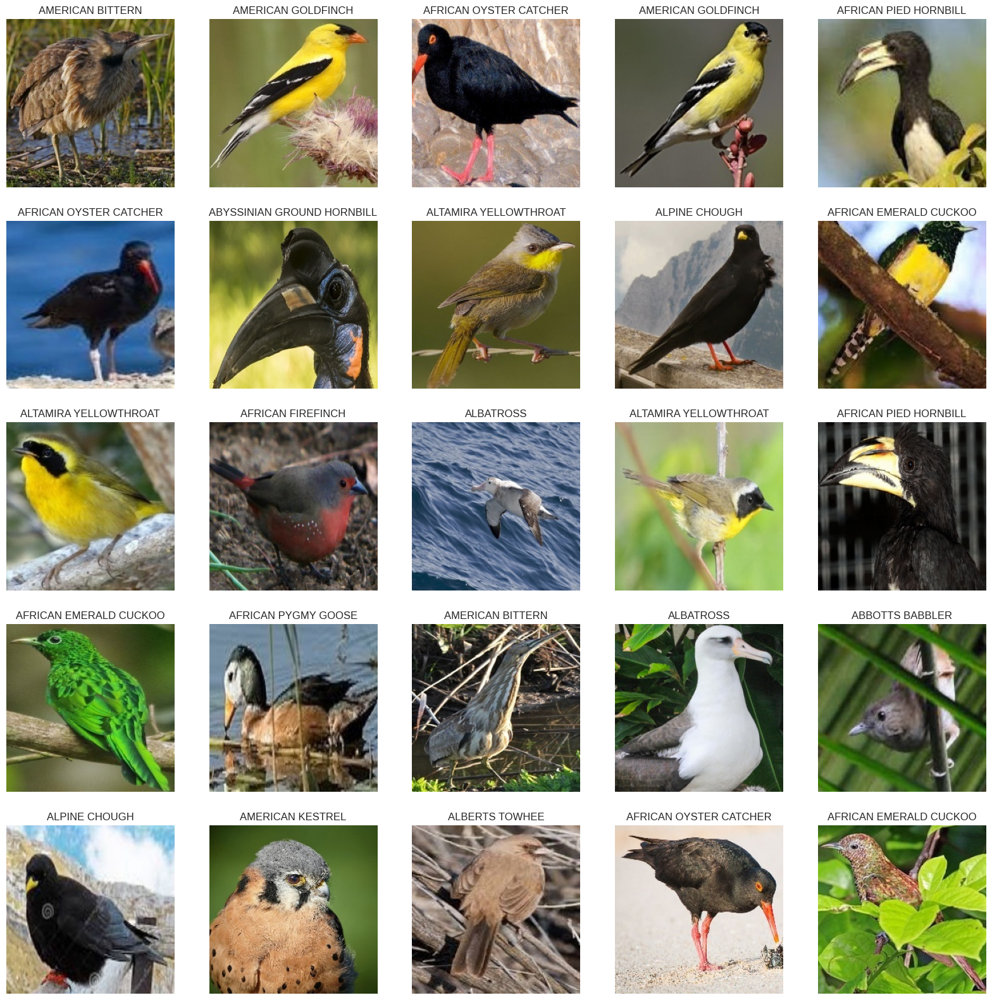

In [11]:
#Plot some of images

fig, ax = plt.subplots(5, 5, figsize=(20, 20))

for i in range(5):
    for j in range(5):
        img = plt.imread(combined_df['filename'][i*5 + j])
        ax[i, j].imshow(img)
        ax[i, j].axis('off')
        ax[i, j].set_title(combined_df['outcome'][i*5 + j])
plt.show()

## Dataset Distribution
plot the distribution of the dataset, both training and validation set

[Text(0, 0, 'AMERICAN FLAMINGO'),
 Text(1, 0, 'ALBERTS TOWHEE'),
 Text(2, 0, 'ALPINE CHOUGH'),
 Text(3, 0, 'AFRICAN PYGMY GOOSE'),
 Text(4, 0, 'AMERICAN BITTERN'),
 Text(5, 0, 'AMERICAN AVOCET'),
 Text(6, 0, 'AFRICAN EMERALD CUCKOO'),
 Text(7, 0, 'ALEXANDRINE PARAKEET'),
 Text(8, 0, 'AMERICAN GOLDFINCH'),
 Text(9, 0, 'AFRICAN PIED HORNBILL'),
 Text(10, 0, 'ALTAMIRA YELLOWTHROAT'),
 Text(11, 0, 'AFRICAN OYSTER CATCHER'),
 Text(12, 0, 'AMERICAN COOT'),
 Text(13, 0, 'ABBOTTS BABBLER'),
 Text(14, 0, 'ALBATROSS'),
 Text(15, 0, 'AFRICAN CROWNED CRANE'),
 Text(16, 0, 'AFRICAN FIREFINCH'),
 Text(17, 0, 'ABBOTTS BOOBY'),
 Text(18, 0, 'ABYSSINIAN GROUND HORNBILL'),
 Text(19, 0, 'AMERICAN KESTREL')]

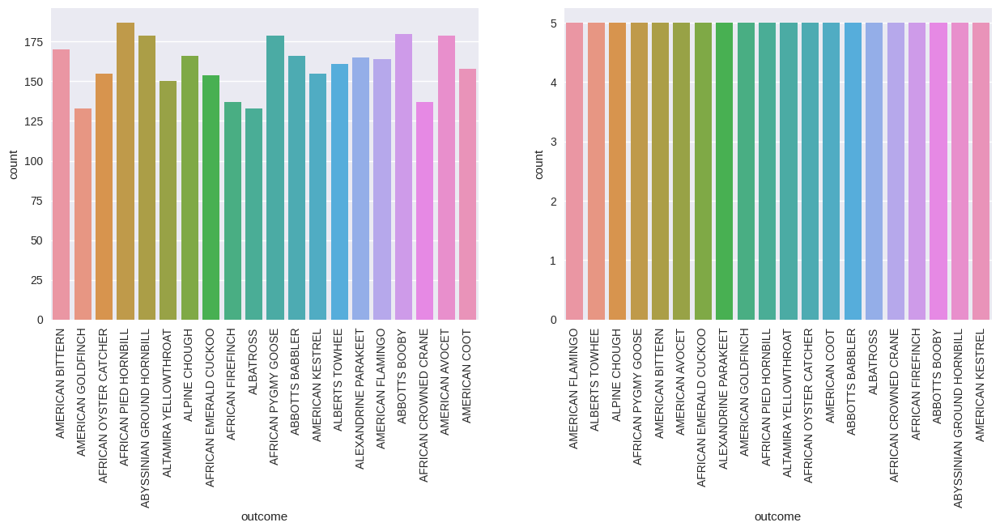

In [12]:
#Plot the distribution of classes

fig, ax = plt.subplots(1, 2, figsize=(15, 5))


sea.countplot(data=train_df, x='outcome', ax=ax[0])
sea.countplot(data=val_df, x='outcome', ax=ax[1])

ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=90)
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=90)

## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [13]:
class BirdDataset:
    def __init__(self, df, transform = None):
        #Initialize the needed data
        self.df = df
        self.samples_len= len(self.df)
        self.transform = transform

    def __len__(self):
        return self.samples_len

    def __getitem__(self, idx):
        # Load and transform an image
        # - Image should be converted to grayscale and then transformed (i did this in model directly)

        img = plt.imread(self.df.iloc[idx, 0])


        if self.transform:
            img = self.transform(img)

        return img


# Apply preprocessings on the image dataset (increasing saturation, ...) by using transforms.ColorJitter for example.


train_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((160, 160)),
    transforms.ColorJitter(saturation=0.5),
    transforms.Normalize(mean = 0, std = 1),
    transforms.RandomHorizontalFlip(p = 0.2)
])

val_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((160, 160)),
    transforms.Normalize(mean = 0, std = 1)
])

# Define transforms and datasets and data loaders


train_dataset = BirdDataset(train_df, transform=train_transform)
val_dataset = BirdDataset(val_df, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

- Increases data diversity: Creates variations of existing images (flips, rotations, crops) to expose the model to more scenarios.
- Reduces overfitting: Prevents the model from memorizing specific training examples by presenting it with a wider range of data. 
- Improves generalization: Helps the model learn more robust features that are less sensitive to variations in real-world images



## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [53]:
import torchvision.models as models
import torch.nn as nn
import torch
import torch.optim as optim
from tqdm import tqdm
import math
from torchvision import transforms

class PerceptualLoss(nn.Module):
    def __init__(self, feature_layers= {1:0.2,3:0.2,6:0.1,8:0.025,13:0.025}, use_half=False):
        super(PerceptualLoss, self).__init__()
        self.feature_layers = feature_layers
        self.vgg = models.vgg16(pretrained=True).features
        for param in self.vgg.parameters():
            param.requires_grad = False
        self.use_half = use_half
        self.vgg.to(device)
        self.vgg.eval()

        
    def forward(self, x, y):
        if self.use_half:
            x = x.half()
            y = y.half()

        loss = 2.0 * F.mse_loss(x,y) 
        x = x.expand(-1, 3, -1, -1)
        y = y.expand(-1, 3, -1, -1)
        
        for i, layer in enumerate(self.vgg):
            x = layer(x)
            y = layer(y)
            if i in self.feature_layers.keys():
                loss += F.mse_loss(x,y) * self.feature_layers[i]
   
        return loss

# Hint: Define the structure of the encoder by using convolutional layers with optional batch normalization.
class Encoder(nn.Module):
    def __init__(self, do_bn=False , num_layers = 4 , first_layer_size = 32):
        super().__init__()
        self.do_bn = do_bn
        self.num_layers = num_layers

        self.inner_blocks = nn.ModuleList()
        cur_size = first_layer_size
        for i in range(num_layers):
            if i==0 :
                self.inner_blocks.append(self.inner_block(1, cur_size, maxpool=2))
            else :
                self.inner_blocks.append(self.inner_block(cur_size, cur_size*2, maxpool=2))
                cur_size *= 2


    def inner_block(self, in_c, out_c, maxpool=2):
        return nn.Sequential(
            nn.Conv2d(in_c, out_c, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.MaxPool2d(maxpool),
            nn.Dropout(0.2),
            nn.Conv2d(out_c, out_c, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.Dropout(0.1)
      )

    def forward(self, x , layer):

        z = self.inner_blocks[layer](x)

        return z



# Hint: Define the decoder's symmetric structure to the encoder for upsampling and reconstructing the input.
class Decoder(nn.Module):
    def __init__(self, do_bn , num_layer = 4 ,  first_layer_c = 256 , output_c = 3):
        #Use ConvTransposed2d
        super().__init__()
        self.do_bn = do_bn
        self.num_layer = num_layer
        self.first_layer_c = first_layer_c
        self.output_c = output_c

        self.inner_blocks = nn.ModuleList()

        cur_size = first_layer_c

        for i in range(num_layer - 1):
            self.inner_blocks.append(self.inner_block(cur_size, cur_size//2))
            cur_size //= 2
        self.inner_blocks.append(self.inner_block(cur_size, output_c, out=True))

        self.conv_blocks = nn.ModuleList()

        cur_size = first_layer_c

        for i in range(num_layer - 1):
            self.conv_blocks.append(self.conv_block(cur_size, cur_size//2))
            cur_size //= 2



    def inner_block(self, in_c, out_c, out=False):
        return  nn.Sequential(
            nn.ConvTranspose2d(in_c, out_c, kernel_size = 3, stride = 1, padding = 1, bias = False),
            nn.Upsample(scale_factor = 2, mode = 'bilinear', align_corners = False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.LeakyReLU(),
            nn.Dropout(0.1),
            nn.Conv2d(out_c, out_c, kernel_size = 3, stride = 1, padding = 1),
            nn.LeakyReLU() if not out else nn.Sigmoid(),
            nn.Dropout(0.2) if not out else nn.Identity(),
        )

    def conv_block(self, in_c, out_c):
        return nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, 1, 1, bias = False),
            nn.BatchNorm2d(out_c) if self.do_bn else nn.Identity(),
            nn.ReLU(),
            nn.Dropout(0.1)
        )

    def forward(self, x ,layer ,  h = None):

        z = self.inner_blocks[layer](x)
        if h is not None:
            z = torch.cat([z, h], dim=1)
            z = self.conv_blocks[layer](z)
        return z




# Hint: Integrate the encoder, decoder, and loss components into the overall network class.
class Net(nn.Module):
    def __init__(self , lr = 1e-3 , do_bn = False , Use_PerceptualLoss = False , num_layers = 4 , first_layer_size = 32):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=do_bn, num_layers=num_layers, first_layer_size=first_layer_size)
        self.decoder = Decoder(do_bn , num_layer=num_layers ,  first_layer_c =first_layer_size*(1<<(num_layers-1)), output_c = 3)
        self.lr = lr
        self.Use_PerceptualLoss = Use_PerceptualLoss

        self.train_loss = []
        self.val_loss = []
        self.cur_train_loss = []
        self.cur_val_loss = []

        self.gray_transform = transforms.Grayscale(num_output_channels=1)

        self.optimizer = optim.Adam(self.parameters(), lr = self.lr)


        #using perceptual loss
        if self.Use_PerceptualLoss :
            self.criterion = PerceptualLoss()
        else :
            self.criterion = nn.MSELoss()
        self.criterion.to(device)








    def forward(self, x):
        x = self.gray_transform(x)

        h = []
        for i in range(self.encoder.num_layers):
            x = self.encoder(x, i)
            h.append(x)

        x = h[-1]
        for i in range(self.decoder.num_layer - 1):
            x = self.decoder(x, i, h[-i-2])
        x = self.decoder(x, self.decoder.num_layer - 1)

        return x

    def compute_loss(self, pred, target):
        #Calculate the combined loss from multiple loss functions.
        return self.criterion(pred, target)


    def training_step(self, X):
        self.optimizer.zero_grad()

        pred = self.forward(X)
        loss = self.compute_loss(pred, X)
        self.cur_train_loss.append(loss.item())

        loss.backward()
        self.optimizer.step()


    def validation_step(self, X):

        with torch.no_grad():
            pred = self.forward(X)
            loss = self.compute_loss(pred, X)
            self.cur_val_loss.append(loss.item())


    def train(self, epochs=10):

        for epoch in range(epochs):
            self.cur_train_loss = []
            self.cur_val_loss =[]
            print("Epoch: ", epoch+1)
            print("training : ")
            progress_bar = tqdm(enumerate(train_loader), total=len(train_loader))
            running_loss = 0.0
            for i, data in progress_bar:
                X = data
                X = X.to(device)
                self.training_step(X)
                running_loss += self.cur_train_loss[-1]
                progress_bar.set_description(f'Epoch: {epoch + 1}, Loss: {running_loss / (i + 1):.5f}')
            print('Training Loss: ', sum(self.cur_train_loss)/len(self.cur_train_loss))
            self.train_loss.append(sum(self.cur_train_loss)/len(self.cur_train_loss))
            print("validation : ")
            for i, data in enumerate(val_loader):
                X = data
                X = X.to(device)
                self.validation_step(X)
            print('Validation Loss: ', sum(self.cur_val_loss)/len(self.cur_val_loss))
            self.val_loss.append(sum(self.cur_val_loss)/len(self.cur_val_loss))
            print('-----------------------------------')





In [54]:
#print the model

model = Net(lr=1e-4 , do_bn = True , Use_PerceptualLoss = True , num_layers = 5 , first_layer_size = 32)
model.to(device)


print(model)

Net(
  (encoder): Encoder(
    (inner_blocks): ModuleList(
      (0): Sequential(
        (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): Dropout(p=0.2, inplace=False)
        (5): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (6): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (7): ReLU()
        (8): Dropout(p=0.1, inplace=False)
      )
      (1): Sequential(
        (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (4): D

In [55]:
! pip install torchsummary

from torchsummary import summary
summary(model, (1, 160, 160))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         Grayscale-1          [-1, 1, 160, 160]               0
            Conv2d-2         [-1, 32, 160, 160]             288
       BatchNorm2d-3         [-1, 32, 160, 160]              64
              ReLU-4         [-1, 32, 160, 160]               0
         MaxPool2d-5           [-1, 32, 80, 80]               0
           Dropout-6           [-1, 32, 80, 80]               0
            Conv2d-7           [-1, 32, 80, 80]           9,216
       BatchNorm2d-8           [-1, 32, 80, 80]              64
              ReLU-9           [-1, 32, 80, 80]               0
          Dropout-10           [-1, 32, 80, 80]               0
          Encoder-11           [-1, 32, 80, 80]               0
           Conv2d-12           [-1, 64, 80, 80]          18,432
      BatchNorm2d-13           [-1, 64, 80, 80]             128
             ReLU-14           [-1, 64,

## Training Phase

In [56]:
# Train
# Students should implement the training loop. During training, monitor both training and validation metrics
# to ensure the model learns effectively without overfitting.

model.train(epochs = 50)

Epoch:  1
training : 


Epoch: 1, Loss: 0.27117: 100%|██████████| 101/101 [00:21<00:00,  4.65it/s]


Training Loss:  0.27116747229996296
validation : 
Validation Loss:  0.24287644401192665
-----------------------------------
Epoch:  2
training : 


Epoch: 2, Loss: 0.21220: 100%|██████████| 101/101 [00:20<00:00,  4.94it/s]


Training Loss:  0.21220264989550752
validation : 
Validation Loss:  0.20212236046791077
-----------------------------------
Epoch:  3
training : 


Epoch: 3, Loss: 0.18159: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.1815902868119797
validation : 
Validation Loss:  0.177119679749012
-----------------------------------
Epoch:  4
training : 


Epoch: 4, Loss: 0.15988: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.1598815462081739
validation : 
Validation Loss:  0.15779798850417137
-----------------------------------
Epoch:  5
training : 


Epoch: 5, Loss: 0.14372: 100%|██████████| 101/101 [00:20<00:00,  4.89it/s]


Training Loss:  0.14371973630225304
validation : 
Validation Loss:  0.14321620389819145
-----------------------------------
Epoch:  6
training : 


Epoch: 6, Loss: 0.13025: 100%|██████████| 101/101 [00:20<00:00,  4.93it/s]


Training Loss:  0.1302522018846899
validation : 
Validation Loss:  0.13132865354418755
-----------------------------------
Epoch:  7
training : 


Epoch: 7, Loss: 0.12009: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.12009330897933186
validation : 
Validation Loss:  0.12286346964538097
-----------------------------------
Epoch:  8
training : 


Epoch: 8, Loss: 0.11302: 100%|██████████| 101/101 [00:20<00:00,  4.95it/s]


Training Loss:  0.1130193879846299
validation : 
Validation Loss:  0.11640017852187157
-----------------------------------
Epoch:  9
training : 


Epoch: 9, Loss: 0.10801: 100%|██████████| 101/101 [00:20<00:00,  4.97it/s]


Training Loss:  0.10801342963287146
validation : 
Validation Loss:  0.11177163943648338
-----------------------------------
Epoch:  10
training : 


Epoch: 10, Loss: 0.10374: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s]


Training Loss:  0.1037382901747628
validation : 
Validation Loss:  0.10799649730324745
-----------------------------------
Epoch:  11
training : 


Epoch: 11, Loss: 0.10134: 100%|██████████| 101/101 [00:20<00:00,  4.93it/s]


Training Loss:  0.10134227950089049
validation : 
Validation Loss:  0.10504000075161457
-----------------------------------
Epoch:  12
training : 


Epoch: 12, Loss: 0.09827: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.09826619738694464
validation : 
Validation Loss:  0.10249080136418343
-----------------------------------
Epoch:  13
training : 


Epoch: 13, Loss: 0.09680: 100%|██████████| 101/101 [00:20<00:00,  4.94it/s]


Training Loss:  0.09680364273562289
validation : 
Validation Loss:  0.10094567760825157
-----------------------------------
Epoch:  14
training : 


Epoch: 14, Loss: 0.09494: 100%|██████████| 101/101 [00:20<00:00,  4.97it/s]


Training Loss:  0.09494294292560898
validation : 
Validation Loss:  0.09910990297794342
-----------------------------------
Epoch:  15
training : 


Epoch: 15, Loss: 0.09306: 100%|██████████| 101/101 [00:20<00:00,  4.93it/s]


Training Loss:  0.09306133922078821
validation : 
Validation Loss:  0.09761709906160831
-----------------------------------
Epoch:  16
training : 


Epoch: 16, Loss: 0.09218: 100%|██████████| 101/101 [00:20<00:00,  4.89it/s]


Training Loss:  0.09217727250686966
validation : 
Validation Loss:  0.09632736071944237
-----------------------------------
Epoch:  17
training : 


Epoch: 17, Loss: 0.09089: 100%|██████████| 101/101 [00:20<00:00,  4.99it/s]


Training Loss:  0.09089221930739903
validation : 
Validation Loss:  0.09513747319579124
-----------------------------------
Epoch:  18
training : 


Epoch: 18, Loss: 0.08950: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s]


Training Loss:  0.08949788519651583
validation : 
Validation Loss:  0.09432154521346092
-----------------------------------
Epoch:  19
training : 


Epoch: 19, Loss: 0.08859: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.08858915411009646
validation : 
Validation Loss:  0.0929990392178297
-----------------------------------
Epoch:  20
training : 


Epoch: 20, Loss: 0.08821: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s]


Training Loss:  0.08820532166426724
validation : 
Validation Loss:  0.09270623698830605
-----------------------------------
Epoch:  21
training : 


Epoch: 21, Loss: 0.08695: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.08694897481415531
validation : 
Validation Loss:  0.09190210327506065
-----------------------------------
Epoch:  22
training : 


Epoch: 22, Loss: 0.08595: 100%|██████████| 101/101 [00:20<00:00,  4.95it/s]


Training Loss:  0.08595188803011829
validation : 
Validation Loss:  0.09100959077477455
-----------------------------------
Epoch:  23
training : 


Epoch: 23, Loss: 0.08503: 100%|██████████| 101/101 [00:20<00:00,  5.02it/s]


Training Loss:  0.08503314535511602
validation : 
Validation Loss:  0.09051987528800964
-----------------------------------
Epoch:  24
training : 


Epoch: 24, Loss: 0.08490: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s]


Training Loss:  0.08490435365993197
validation : 
Validation Loss:  0.09033986367285252
-----------------------------------
Epoch:  25
training : 


Epoch: 25, Loss: 0.08443: 100%|██████████| 101/101 [00:20<00:00,  4.91it/s]


Training Loss:  0.08443069339978813
validation : 
Validation Loss:  0.08986715041100979
-----------------------------------
Epoch:  26
training : 


Epoch: 26, Loss: 0.08405: 100%|██████████| 101/101 [00:20<00:00,  5.00it/s]


Training Loss:  0.08405229368127219
validation : 
Validation Loss:  0.08902731351554394
-----------------------------------
Epoch:  27
training : 


Epoch: 27, Loss: 0.08289: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.08289135808106696
validation : 
Validation Loss:  0.08875931054353714
-----------------------------------
Epoch:  28
training : 


Epoch: 28, Loss: 0.08331: 100%|██████████| 101/101 [00:20<00:00,  4.94it/s]


Training Loss:  0.08330633233089259
validation : 
Validation Loss:  0.08810984902083874
-----------------------------------
Epoch:  29
training : 


Epoch: 29, Loss: 0.08246: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.08246454574389032
validation : 
Validation Loss:  0.08776874653995037
-----------------------------------
Epoch:  30
training : 


Epoch: 30, Loss: 0.08190: 100%|██████████| 101/101 [00:20<00:00,  4.90it/s]


Training Loss:  0.08189593764519927
validation : 
Validation Loss:  0.08712051995098591
-----------------------------------
Epoch:  31
training : 


Epoch: 31, Loss: 0.08193: 100%|██████████| 101/101 [00:20<00:00,  4.92it/s]


Training Loss:  0.08193354330735632
validation : 
Validation Loss:  0.08689901977777481
-----------------------------------
Epoch:  32
training : 


Epoch: 32, Loss: 0.08145: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.08144750468211599
validation : 
Validation Loss:  0.08682350628077984
-----------------------------------
Epoch:  33
training : 


Epoch: 33, Loss: 0.08105: 100%|██████████| 101/101 [00:20<00:00,  4.90it/s]


Training Loss:  0.08104809314602672
validation : 
Validation Loss:  0.08607601188123226
-----------------------------------
Epoch:  34
training : 


Epoch: 34, Loss: 0.08068: 100%|██████████| 101/101 [00:20<00:00,  4.97it/s]


Training Loss:  0.08067663397529337
validation : 
Validation Loss:  0.08602301962673664
-----------------------------------
Epoch:  35
training : 


Epoch: 35, Loss: 0.08040: 100%|██████████| 101/101 [00:20<00:00,  4.94it/s]


Training Loss:  0.08040239425873992
validation : 
Validation Loss:  0.08560523577034473
-----------------------------------
Epoch:  36
training : 


Epoch: 36, Loss: 0.08019: 100%|██████████| 101/101 [00:20<00:00,  4.95it/s]


Training Loss:  0.08019244552838921
validation : 
Validation Loss:  0.08535214886069298
-----------------------------------
Epoch:  37
training : 


Epoch: 37, Loss: 0.07981: 100%|██████████| 101/101 [00:20<00:00,  5.01it/s]


Training Loss:  0.07981122572823326
validation : 
Validation Loss:  0.08530301228165627
-----------------------------------
Epoch:  38
training : 


Epoch: 38, Loss: 0.07936: 100%|██████████| 101/101 [00:20<00:00,  5.01it/s]


Training Loss:  0.07935629017872385
validation : 
Validation Loss:  0.08518106304109097
-----------------------------------
Epoch:  39
training : 


Epoch: 39, Loss: 0.07870: 100%|██████████| 101/101 [00:20<00:00,  4.93it/s]


Training Loss:  0.07869583818286953
validation : 
Validation Loss:  0.08428222499787807
-----------------------------------
Epoch:  40
training : 


Epoch: 40, Loss: 0.07879: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.07878785561954621
validation : 
Validation Loss:  0.08461813256144524
-----------------------------------
Epoch:  41
training : 


Epoch: 41, Loss: 0.07948: 100%|██████████| 101/101 [00:20<00:00,  4.98it/s]


Training Loss:  0.07947697851917532
validation : 
Validation Loss:  0.08376501686871052
-----------------------------------
Epoch:  42
training : 


Epoch: 42, Loss: 0.07830: 100%|██████████| 101/101 [00:20<00:00,  4.95it/s]


Training Loss:  0.07830027830187637
validation : 
Validation Loss:  0.08411059156060219
-----------------------------------
Epoch:  43
training : 


Epoch: 43, Loss: 0.07914: 100%|██████████| 101/101 [00:20<00:00,  5.00it/s]


Training Loss:  0.07913503559804198
validation : 
Validation Loss:  0.08340230956673622
-----------------------------------
Epoch:  44
training : 


Epoch: 44, Loss: 0.07861: 100%|██████████| 101/101 [00:20<00:00,  5.02it/s]


Training Loss:  0.07861410512930096
validation : 
Validation Loss:  0.08371124044060707
-----------------------------------
Epoch:  45
training : 


Epoch: 45, Loss: 0.07854: 100%|██████████| 101/101 [00:20<00:00,  4.92it/s]


Training Loss:  0.07853727950022953
validation : 
Validation Loss:  0.08343129605054855
-----------------------------------
Epoch:  46
training : 


Epoch: 46, Loss: 0.07780: 100%|██████████| 101/101 [00:20<00:00,  5.05it/s]


Training Loss:  0.07779505310377272
validation : 
Validation Loss:  0.08315252885222435
-----------------------------------
Epoch:  47
training : 


Epoch: 47, Loss: 0.07718: 100%|██████████| 101/101 [00:20<00:00,  4.92it/s]


Training Loss:  0.07717985755736285
validation : 
Validation Loss:  0.08286925218999386
-----------------------------------
Epoch:  48
training : 


Epoch: 48, Loss: 0.07704: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s]


Training Loss:  0.07704292215628199
validation : 
Validation Loss:  0.08290414698421955
-----------------------------------
Epoch:  49
training : 


Epoch: 49, Loss: 0.07759: 100%|██████████| 101/101 [00:19<00:00,  5.06it/s]


Training Loss:  0.07759478024326928
validation : 
Validation Loss:  0.08245434053242207
-----------------------------------
Epoch:  50
training : 


Epoch: 50, Loss: 0.07743: 100%|██████████| 101/101 [00:20<00:00,  4.90it/s]


Training Loss:  0.07743277946616163
validation : 
Validation Loss:  0.08241110108792782
-----------------------------------


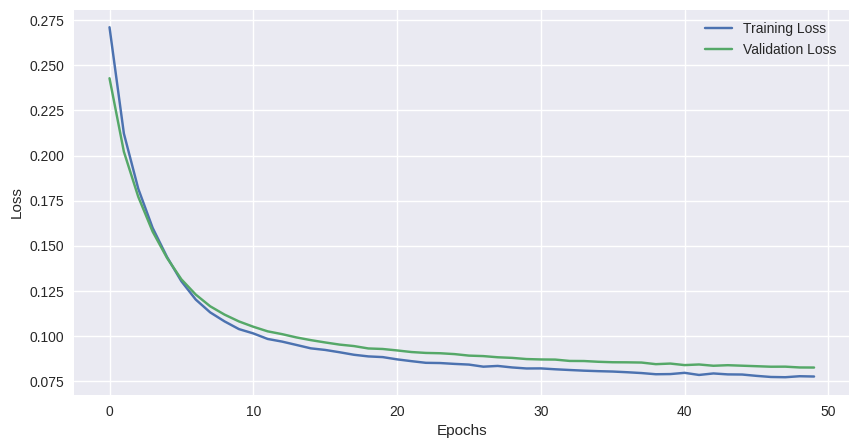

In [57]:
# Plot training and validation loss over epochs
fig = plt.figure(figsize=(10, 5))
plt.plot(model.train_loss, label='Training Loss')
plt.plot(model.val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

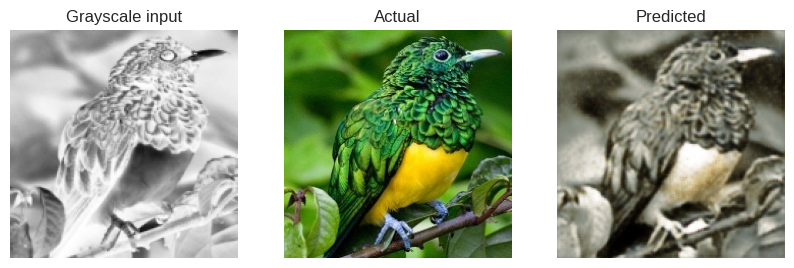

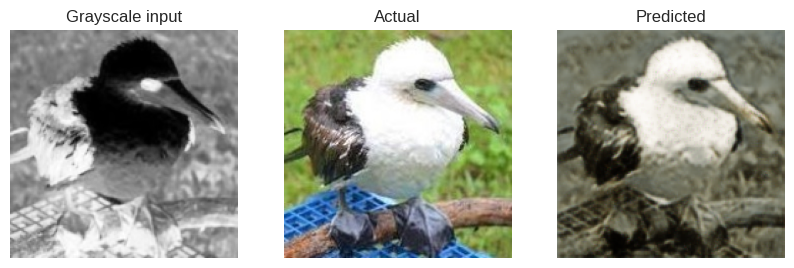

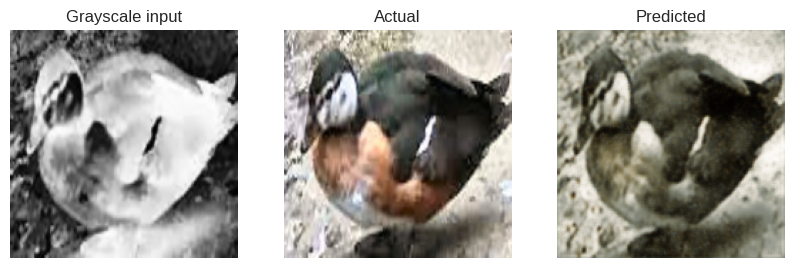

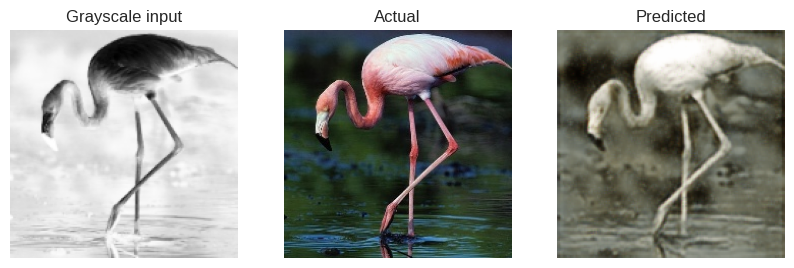

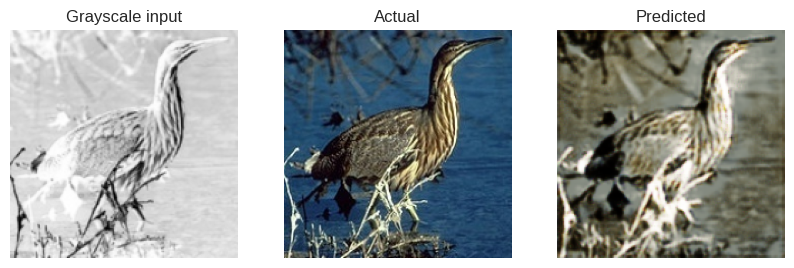

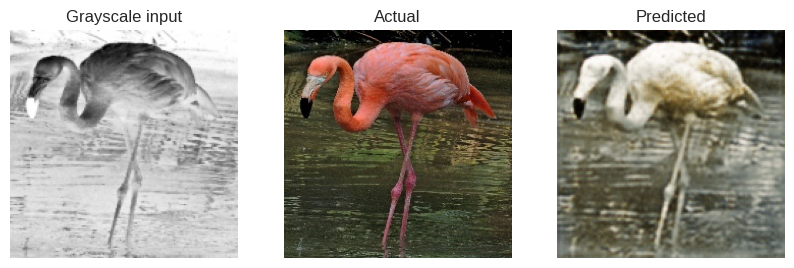

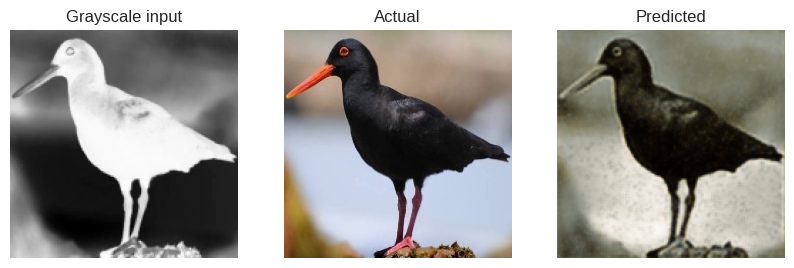

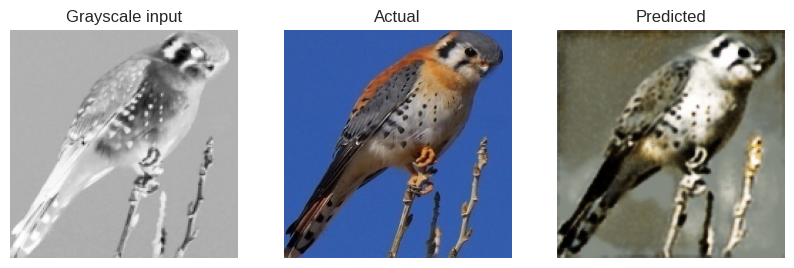

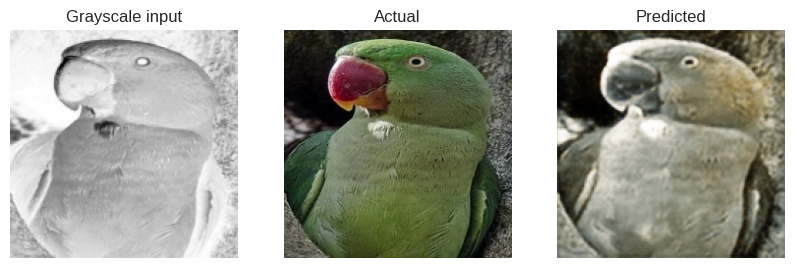

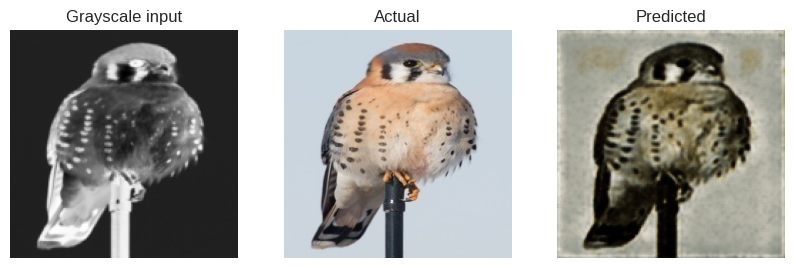

In [71]:
#Plot grayscale, actual, and predicted inputs

def plot_images(img, x_img, pred):
    plt.figure(figsize = (10, 5))
    plt.subplot(1,3,1)
    plt.title('Grayscale input')
    plt.imshow(x_img[0][0].detach().numpy())
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.title('Actual')
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.title('Predicted')
    plt.imshow(pred.detach().numpy())
    plt.axis('off')

    plt.show()

for img_file in val_df.sample(n = 10)['filename']:

    img = plt.imread(img_file)[:, :, :3]

    x_img = model.gray_transform(val_transform(img)).view(-1, 1, 160, 160)

    model = model.to('cpu')
    with torch.no_grad():
        pred = model(x_img)
        pred = pred[0]
        pred = torch.einsum('ijk->jki', pred)

    plot_images(img, x_img, pred)

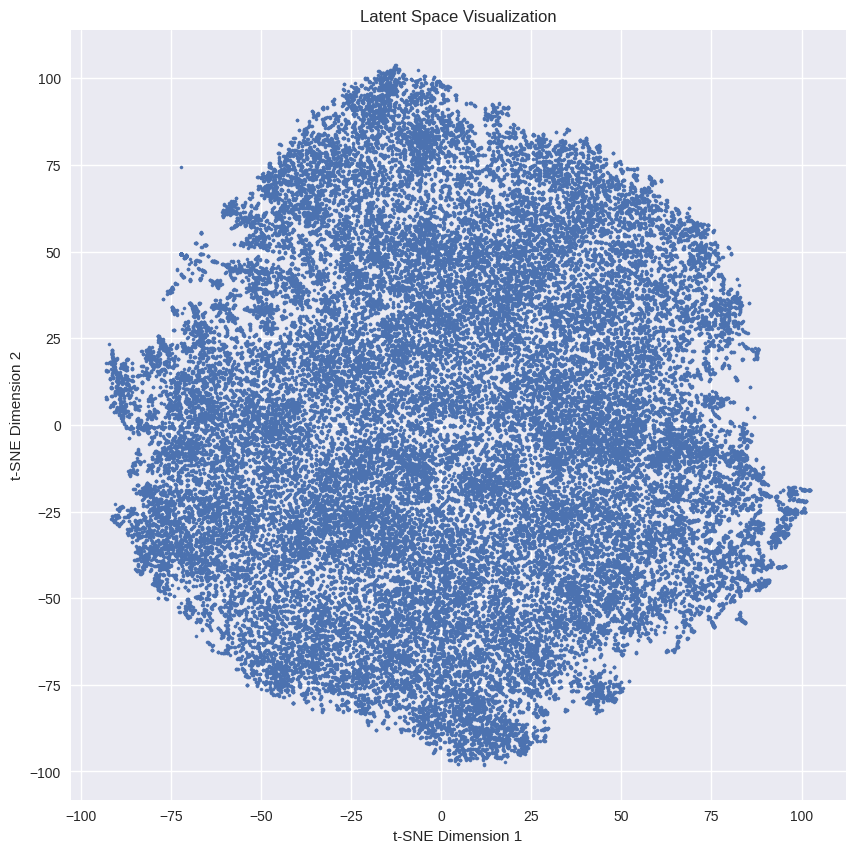

In [69]:
# Visualizing the Latent Space
# Latent space visualizations are a powerful tool to understand how the VAE encodes data.
# In this task, students are required to implement a visualization routine to observe the distribution of their data within the latent space.
# The goal is to project high-dimensional encoded data into two dimensions using t-SNE and inspect how different data points are clustered.

import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

# Function to visualize the latent space
def visualize_latent_space(encoder, data_loader, num_samples=1000):
    """
    Uses a 2-dimensional t-SNE plot to visualize latent space of encoded images.
    
    # TODO: Implement a loop to encode a batch of images and collect their latent representations.
    # TODO: Use t-SNE to reduce dimensions of these latent representations for visualization.

    Parameters:
    encoder (torch.nn.Module): The encoder model component of the VAE.
    data_loader (torch.utils.data.DataLoader)
    num_samples (int): Number of samples to visualize
    """
    # - Set model to evaluation mode
    encoder.eval()

    # - Limit the number of samples based on the user's preference
    num_samples = min(num_samples, len(data_loader.dataset))

    # - Move images to the same device as model
    device = next(encoder.parameters()).device

    #  Use the encoder to get the mean (mu) of the latent distribution
    latent_vectors = []
    for i, data in enumerate(data_loader):
        images = data.to(device)
        x = model.gray_transform(images)
        for i in range(5):
            x = model.encoder(x, i)
        for u in range(x.shape[0]):
            latent_vectors.append(x[u].view(x[u].size(0) , -1))
        if len(latent_vectors) * data_loader.batch_size >= num_samples:
            break
       
    # - Stack all obtained latent vectors
    latent_vectors = torch.cat(latent_vectors, dim=0).detach().cpu().numpy()
    
    
    # - t-SNE reduction to 2D for visualization
    tsne = TSNE(n_components=2, random_state=0)
    latent_vectors_2d = tsne.fit_transform(latent_vectors)
    
    
    # - Plotting the 2D projection
    plt.figure(figsize=(10, 10))
    plt.scatter(latent_vectors_2d[:, 0], latent_vectors_2d[:, 1], s=5)
    plt.title('Latent Space Visualization')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()
    

# TODO: Use visualize_latent_space function post-training to observe the latent space
visualize_latent_space(model.encoder, train_loader, num_samples=3208)


How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?


Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

In image colorization, encoder-decoder architectures excel at learning complex data distributions by:

- Feature Extraction: The encoder part of the network learns to extract meaningful features from the grayscale input image. These features capture essential information like edges, shapes, and textures, which are crucial for determining the appropriate colors. 
- Bottleneck Representation: The compressed representation in the bottleneck forces the encoder to learn the most important and discriminative features, discarding irrelevant information. This helps the model focus on the key aspects of the image that are relevant for colorization. 
- Decoding and Reconstruction: The decoder part of the network learns to reconstruct the original colored image from the compressed feature representation. This process encourages the model to learn the complex relationships between the grayscale image and its corresponding colors. 


Key Differences from Simple Autoencoders:

- Focus on Colorization: While simple autoencoders aim to reconstruct the input image as accurately as possible, encoder-decoder architectures for colorization specifically focus on learning the mapping between grayscale images and their corresponding color information.
- Specialized Decoders: The decoders in colorization architectures are often designed to generate color information, such as by predicting color channels directly or using techniques like conditional generation.
- Loss Functions: Colorization models often use specialized loss functions that prioritize accurate color prediction, such as perceptual losses or adversarial losses.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

- MSE: Compares pixel-by-pixel differences, often leading to overly smooth or unnatural results.
- Perceptual: Compares features extracted by a pre-trained network (like VGG), capturing higher-level information like edges, textures, and object shapes, resulting in more natural and visually appealing colorizations.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

- Fidelity: A higher-dimensional latent space allows the VAE to capture more complex variations and details in the data, potentially leading to higher fidelity images that are more accurate and realistic. However, excessively high dimensionality can lead to overfitting and difficulties in optimization.

- Diversity: A higher-dimensional latent space generally allows for greater diversity in the generated images. This is because a higher-dimensional space provides more room for the model to explore different variations and combinations of features. However, very high dimensionality can lead to the model generating unrealistic or nonsensical images.

Varying Dimensionality:

- Low dimensionality: May lead to low fidelity and limited diversity, with generated images appearing overly simplistic or repetitive.
- High dimensionality: Can improve fidelity and diversity but may also lead to overfitting, mode collapse, and difficulties in training and sampling.

# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [2]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

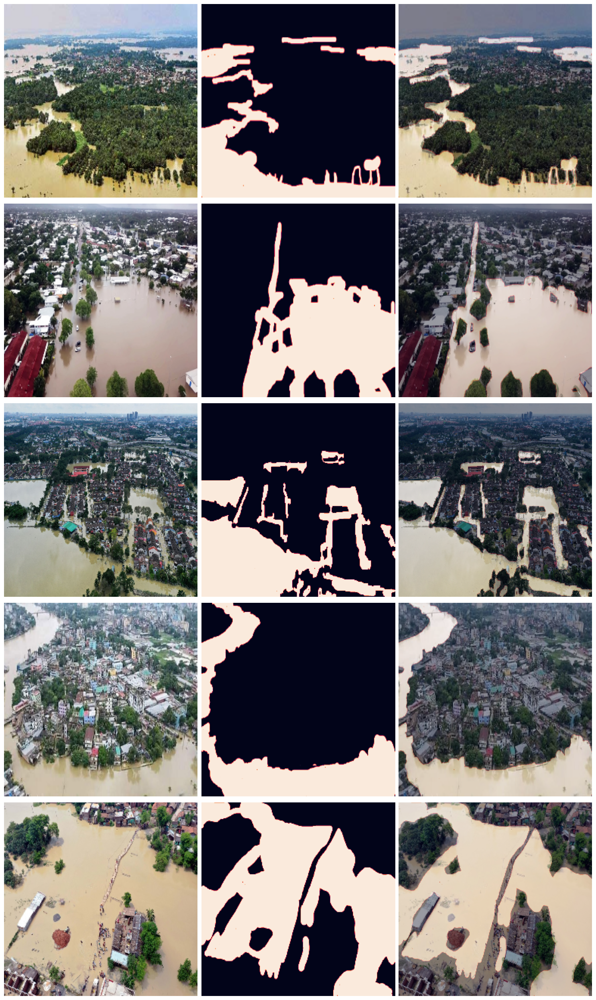

In [3]:
def create_data(data_dir):
    """
    Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    images_path = []
    masks_path = []

    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if 'Mask' in root:
                masks_path.append(os.path.join(root, file))
            else:
                images_path.append(os.path.join(root, file))
                
    
    images_path = sorted(images_path)
    masks_path = sorted(masks_path)
    
    del images_path[0]
    del masks_path[0]
        
    return images_path, masks_path


    

def load_image(image , SIZE ,mask = False):
    """
    Load and resize an individual image to the specified size, scaling pixel values appropriately.
    - Convert image to array and normalize pixel values.
    - Use resizing techniques to ensure uniform image dimensions.
    """
    
    img = cv2.imread(image)
    if mask : 
        img = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    else : 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (SIZE, SIZE))
    img = img / 255.0
    return img


def load_images(image_paths, SIZE, mask=False, trim=None):
    """
    Batch process a list of image paths, loading and organizing images into a numpy array.
    - Handle both image and mask files optionally, managing different channel dimensions.
    - Optionally trim the list of images to handle a subset of data.
    """
    
    images = []
    for i in range(len(image_paths)):
        if i == trim:
            break
        if mask:
            img = load_image(image_paths[i], SIZE , mask=True)
            images.append(img)
        else:
            img = load_image(image_paths[i], SIZE)
            images.append(img)     
    
    return np.array(images)
    

def show_image(image, title=None, cmap=None, alpha=1 ,fig=None , ax = None):
    """
    Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    
    plt_show = False
    if fig is None:
        fig, ax = plt.subplots()
        plt_show = True
    ax.imshow(image, cmap=cmap, alpha=alpha)
    ax.axis('off')
    if title:
        ax.set_title(title)
    
    if plt_show: 
        plt.show()
    

def show_mask(image, mask, cmap=None, alpha=0.4 , fig=None , ax = None):
    """
    Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    plt_show = False
    if fig is None:
        fig, ax = plt.subplots()
        plt_show = True
    ax.imshow(image, cmap='gray')
    ax.imshow(mask, cmap=cmap, alpha=alpha)
    ax.axis('off')  
    if plt_show : 
        plt.show()
    
    

def show_images(imgs, msks):
    """
    TODO: Display multiple image-mask pairs to examine the dataset distribution.
    - Randomly select sample pairs of images and masks for visualization.
    - Use subplots to arrange visuals neatly and use tight layout for optimization.
    """
    
    fig, ax = plt.subplots(5,3, figsize=(15, 25))
    for i in range(5):
        idx = np.random.randint(0, len(imgs))
        img = imgs[idx]
        msk = msks[idx]
        show_image(img, fig=fig , ax=ax[i, 0])
        show_image(msk, fig=fig, ax=ax[i, 1])
        show_mask(img, msk, fig=fig, ax=ax[i, 2])
        
    plt.tight_layout()
    plt.show()

SIZE = 256

#Load and visualize images

images_path , masks_path = create_data('/kaggle/input/image-mask')


images = load_images(images_path , SIZE)
masks = load_images(masks_path , SIZE , mask=True)

show_images(images , masks)

In [4]:
! pip install torchsummary

In [81]:
class PicDataset(Dataset):
    def __init__(self, images, masks , transformer):
        super(Dataset, self).__init__()
        self.images = images
        self.masks = masks
        self.transformer = transformer

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img, msk = self.images[idx], self.masks[idx]
        img, msk = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1), torch.tensor(msk, dtype=torch.float32).unsqueeze(0)
        comb = torch.cat((img, msk), dim=0) 
        comb = self.transformer(comb)
        img , msk = comb[0:3] , comb[3]
        return img , msk


train_transform = transforms.Compose([
    transforms.RandomCrop((200, 200)),
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(p = 0.2)
])
valid_transform = transforms.Compose(
    [
        transforms.Resize((256, 256)),
    ]
)

data_train_image , data_val_image , data_train_mask , data_val_mask = train_test_split(images , masks , test_size=0.2 , random_state=0)
data_train = PicDataset(data_train_image , data_train_mask , transformer=train_transform)
data_val = PicDataset(data_val_image , data_val_mask,transformer=valid_transform)

## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [ ]:
# Enhancing U-Net with Dice and Jaccard Losses for Segmentation
# i used my code from my last semester ai_project for the U-Net model

class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Dice coefficient loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """

        pred = pred.contiguous().view(-1)
        target = target.contiguous().view(-1)
        
        intersection = (pred * target).sum()
        union = pred.sum() + target.sum()

        dice = (2. * intersection + self.smooth) / (union + self.smooth)

        dice_loss = 1.0 - dice

        return dice_loss


    
class JaccardLoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(JaccardLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        """
        Compute the Jaccard (IoU) loss.
        - pred: predicted segmentation probabilities
        - target: ground truth masks
        """
        pred = pred.squeeze(1)
        target = target.squeeze(1)

        intersection = (pred * target).sum()
        union = (pred + target).sum() - intersection

        jaccard = (intersection + self.smooth) / (union + self.smooth)

        jaccard_loss = 1 - jaccard

        return jaccard_loss



class EncoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch, dropout_prob=0):
        super(EncoderBlock, self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
                                  nn.BatchNorm2d(out_ch),
                                  nn.ReLU(),
                                  nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                                  nn.ReLU(),
                                  nn.BatchNorm2d(out_ch)
                                  )
        self.dropout_prob = nn.Dropout2d(p=dropout_prob) if dropout_prob > 0 else None

    def forward(self, x):
        x = self.conv(x) if self.dropout_prob is None else self.dropout_prob(self.conv(x))
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(DecoderBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        self.conv1 = EncoderBlock(2*out_ch, out_ch)
        self.att = AttentionBlock(out_ch, out_ch, in_ch)


    def forward(self, x, x2):
        up = self.up(x)
        attention = self.att(x2, x)
        merge = torch.cat((up, attention), dim=1)
        conv = self.conv1(merge)

        return conv



class AttentionBlock(nn.Module):
    def __init__(self, F_l, F_int, F_g):
        super(AttentionBlock, self).__init__()
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, kernel_size=1, stride=2), nn.BatchNorm2d(F_int))
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, kernel_size=1, stride=1), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, kernel_size=1, stride=1), nn.BatchNorm2d(1), nn.Sigmoid())
        self.relu = nn.ReLU()

    def forward(self, x, g):
        w_x =self.W_x(x)
        w_g =self.W_g(g)
        psi = self.psi(self.relu(w_x + w_g))
        psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)
        return x * psi


class UNetModel(nn.Module):
    def __init__(self , in_ch=3, out_channel=1):
        super(UNetModel, self).__init__()
        #Define encoder, decoder blocks, and output layer.
        self.max_pool = nn.MaxPool2d(2 , 2)
        out_ch = 64
        self.block1 = EncoderBlock(in_ch, out_ch)
        self.block2 = EncoderBlock(out_ch, out_ch*2)
        self.block3 = EncoderBlock(out_ch*2, out_ch*4)
        self.block4 = EncoderBlock(out_ch*4, out_ch*8, dropout_prob=0.3)

        self.block5 = EncoderBlock(out_ch*8, out_ch*16, dropout_prob=0.3)

        self.block6 = DecoderBlock(out_ch*16, out_ch*8)
        self.block7 = DecoderBlock(out_ch*8, out_ch*4)
        self.block8 = DecoderBlock(out_ch*4, out_ch*2)
        self.block9 = DecoderBlock(out_ch*2, out_ch)
        self.out_block = nn.Sequential(nn.Conv2d(out_ch , out_channel, kernel_size=1),nn.Sigmoid())

        self.loss_dice = DiceLoss().to(device)
        self.loss_jaccard = JaccardLoss().to(device)
        

    def forward(self, x):
        conv1 = self.block1(x)
        pool1 = self.max_pool(conv1)

        conv2 = self.block2(pool1)
        pool2 = self.max_pool(conv2)

        conv3 = self.block3(pool2)
        pool3 = self.max_pool(conv3)

        conv4 = self.block4(pool3)
        pool4 = self.max_pool(conv4)

        conv5 = self.block5(pool4)

        up1 = self.block6(conv5, conv4)
        up2 = self.block7(up1, conv3)
        up3 = self.block8(up2, conv2)
        up4 = self.block9(up3, conv1)

        out = self.out_block(up4)

        return out

    def compute_loss(self, pred, target):
        """
        Calculate the combined segmentation loss using Dice and Jaccard losses.
        - pred: predicted probability maps
        - target: ground truth probability maps
        """
        return   0.9 * self.loss_jaccard(pred , target) + 0.1 * self.loss_dice(pred , target)


## Training

In [85]:

def get_acc(pred, target):
    pred = pred.view(-1)
    target = target.view(-1)
    pred = (pred > 0.5).float()
    accuracy = (pred == target).float().mean()
    return accuracy.item()


BATCH_SIZE=8
EPOCHS = 100
EPOCHS_ASK = 50
LR = 1e-5
train_loader = DataLoader(data_train, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(data_val, batch_size=BATCH_SIZE, shuffle=True)


unet_model = UNetModel().to(device)
optimizer = torch.optim.Adam(unet_model.parameters(), lr =LR)

train_losses = []
val_losses = []
train_accs = []
val_accs = []

unet_model.train()

for epoch in range(EPOCHS):
    cur_train_loss = 0.0
    cur_val_loss = 0.0
    train_acc = 0.0
    val_acc = 0.0
    print("EPOCH: " , epoch+1)
    print("training : ")
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader))
    len_data = 0
    for i , data in progress_bar:
        len_data+=1
        imgs , msks = data
        imgs = imgs.to(device)
        msks = msks.to(device)
        optimizer.zero_grad()
        msks_hat = unet_model.forward(imgs)
        train_acc += get_acc(msks_hat , msks)
        loss = unet_model.compute_loss(msks_hat , msks)
        cur_train_loss+=loss
        loss.backward()
        optimizer.step()
        progress_bar.set_description(f'Epoch: {epoch + 1}, Loss: {cur_train_loss / (i + 1):.4f}')
    train_losses.append(cur_train_loss/(len_data+1))
    train_accs.append(train_acc/(len_data+1))
    print(f"accuracy : {train_acc/(len_data+1):.4f}\n")
    
    print("validation : ")
    unet_model.eval()
    len_data = 0
    with torch.no_grad():
        for i, data in enumerate(val_loader):
            len_data+=1
            imgs , msks = data
            imgs = imgs.to(device)
            msks = msks.to(device)
            msks_hat = unet_model.forward(imgs)
            val_acc += get_acc(msks_hat , msks)
            loss = unet_model.compute_loss(msks_hat , msks)
            cur_val_loss+=loss
    val_losses.append(cur_val_loss/(len_data+1))
    val_accs.append(val_acc/(len_data+1))
    print(f"loss : {cur_val_loss/(len_data+1):.4f}")
    print(f"accuracy : {val_acc/(len_data+1):.4f}\n")


EPOCH:  1
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

<ipython-input-84-05af04adc617>:101: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)


accuracy : 0.6082

validation : 
loss : 0.5698
accuracy : 0.3844

EPOCH:  2
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.3650

validation : 
loss : 0.4736
accuracy : 0.3962

EPOCH:  3
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.5235

validation : 
loss : 0.3985
accuracy : 0.6452

EPOCH:  4
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.6956

validation : 
loss : 0.3130
accuracy : 0.6807

EPOCH:  5
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7251

validation : 
loss : 0.2978
accuracy : 0.7347

EPOCH:  6
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7521

validation : 
loss : 0.3691
accuracy : 0.7033

EPOCH:  7
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7518

validation : 
loss : 0.3217
accuracy : 0.7316

EPOCH:  8
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7710

validation : 
loss : 0.2615
accuracy : 0.7471

EPOCH:  9
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7667

validation : 
loss : 0.2573
accuracy : 0.7466

EPOCH:  10
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7725

validation : 
loss : 0.2705
accuracy : 0.7362

EPOCH:  11
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7667

validation : 
loss : 0.2773
accuracy : 0.7464

EPOCH:  12
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7770

validation : 
loss : 0.2501
accuracy : 0.7465

EPOCH:  13
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7795

validation : 
loss : 0.2588
accuracy : 0.7447

EPOCH:  14
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7727

validation : 
loss : 0.3423
accuracy : 0.7341

EPOCH:  15
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7778

validation : 
loss : 0.2521
accuracy : 0.7598

EPOCH:  16
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7892

validation : 
loss : 0.2567
accuracy : 0.7501

EPOCH:  17
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7868

validation : 
loss : 0.2689
accuracy : 0.7423

EPOCH:  18
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7948

validation : 
loss : 0.2357
accuracy : 0.7580

EPOCH:  19
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7940

validation : 
loss : 0.2346
accuracy : 0.7610

EPOCH:  20
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7986

validation : 
loss : 0.2362
accuracy : 0.7596

EPOCH:  21
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7963

validation : 
loss : 0.2571
accuracy : 0.7587

EPOCH:  22
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7929

validation : 
loss : 0.2625
accuracy : 0.7519

EPOCH:  23
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7963

validation : 
loss : 0.2457
accuracy : 0.7587

EPOCH:  24
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8047

validation : 
loss : 0.2733
accuracy : 0.7373

EPOCH:  25
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8018

validation : 
loss : 0.2406
accuracy : 0.7594

EPOCH:  26
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7996

validation : 
loss : 0.2431
accuracy : 0.7566

EPOCH:  27
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8030

validation : 
loss : 0.2154
accuracy : 0.7674

EPOCH:  28
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8035

validation : 
loss : 0.2396
accuracy : 0.7590

EPOCH:  29
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.7988

validation : 
loss : 0.2196
accuracy : 0.7697

EPOCH:  30
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8103

validation : 
loss : 0.2151
accuracy : 0.7708

EPOCH:  31
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8081

validation : 
loss : 0.2685
accuracy : 0.7504

EPOCH:  32
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8075

validation : 
loss : 0.2220
accuracy : 0.7721

EPOCH:  33
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8093

validation : 
loss : 0.2037
accuracy : 0.7768

EPOCH:  34
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8108

validation : 
loss : 0.2127
accuracy : 0.7746

EPOCH:  35
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8184

validation : 
loss : 0.2431
accuracy : 0.7612

EPOCH:  36
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8132

validation : 
loss : 0.2300
accuracy : 0.7653

EPOCH:  37
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8096

validation : 
loss : 0.2273
accuracy : 0.7682

EPOCH:  38
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8126

validation : 
loss : 0.2173
accuracy : 0.7760

EPOCH:  39
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8144

validation : 
loss : 0.2433
accuracy : 0.7659

EPOCH:  40
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8204

validation : 
loss : 0.2072
accuracy : 0.7798

EPOCH:  41
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8220

validation : 
loss : 0.2223
accuracy : 0.7591

EPOCH:  42
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8165

validation : 
loss : 0.2206
accuracy : 0.7709

EPOCH:  43
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8211

validation : 
loss : 0.2062
accuracy : 0.7737

EPOCH:  44
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8246

validation : 
loss : 0.2124
accuracy : 0.7757

EPOCH:  45
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8234

validation : 
loss : 0.1941
accuracy : 0.7812

EPOCH:  46
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8226

validation : 
loss : 0.1941
accuracy : 0.7834

EPOCH:  47
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8227

validation : 
loss : 0.1972
accuracy : 0.7763

EPOCH:  48
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8259

validation : 
loss : 0.2239
accuracy : 0.7741

EPOCH:  49
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8212

validation : 
loss : 0.1956
accuracy : 0.7779

EPOCH:  50
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8241

validation : 
loss : 0.1976
accuracy : 0.7782

EPOCH:  51
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8303

validation : 
loss : 0.2004
accuracy : 0.7820

EPOCH:  52
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8306

validation : 
loss : 0.1993
accuracy : 0.7807

EPOCH:  53
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8336

validation : 
loss : 0.2215
accuracy : 0.7682

EPOCH:  54
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8349

validation : 
loss : 0.1871
accuracy : 0.7843

EPOCH:  55
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8313

validation : 
loss : 0.2039
accuracy : 0.7794

EPOCH:  56
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8295

validation : 
loss : 0.2112
accuracy : 0.7820

EPOCH:  57
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8343

validation : 
loss : 0.1880
accuracy : 0.7844

EPOCH:  58
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8340

validation : 
loss : 0.1909
accuracy : 0.7858

EPOCH:  59
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8328

validation : 
loss : 0.2106
accuracy : 0.7797

EPOCH:  60
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8368

validation : 
loss : 0.2163
accuracy : 0.7773

EPOCH:  61
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8334

validation : 
loss : 0.2037
accuracy : 0.7808

EPOCH:  62
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8376

validation : 
loss : 0.1906
accuracy : 0.7859

EPOCH:  63
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8356

validation : 
loss : 0.2080
accuracy : 0.7750

EPOCH:  64
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8354

validation : 
loss : 0.2086
accuracy : 0.7737

EPOCH:  65
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8376

validation : 
loss : 0.2072
accuracy : 0.7795

EPOCH:  66
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8399

validation : 
loss : 0.2138
accuracy : 0.7754

EPOCH:  67
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8402

validation : 
loss : 0.2120
accuracy : 0.7814

EPOCH:  68
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8403

validation : 
loss : 0.2214
accuracy : 0.7765

EPOCH:  69
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8372

validation : 
loss : 0.2408
accuracy : 0.7753

EPOCH:  70
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8400

validation : 
loss : 0.2031
accuracy : 0.7817

EPOCH:  71
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8384

validation : 
loss : 0.1908
accuracy : 0.7872

EPOCH:  72
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8402

validation : 
loss : 0.2421
accuracy : 0.7677

EPOCH:  73
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8392

validation : 
loss : 0.2143
accuracy : 0.7787

EPOCH:  74
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8428

validation : 
loss : 0.1992
accuracy : 0.7812

EPOCH:  75
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8431

validation : 
loss : 0.1993
accuracy : 0.7837

EPOCH:  76
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8479

validation : 
loss : 0.1999
accuracy : 0.7817

EPOCH:  77
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8468

validation : 
loss : 0.1976
accuracy : 0.7858

EPOCH:  78
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8450

validation : 
loss : 0.1975
accuracy : 0.7850

EPOCH:  79
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8461

validation : 
loss : 0.2041
accuracy : 0.7809

EPOCH:  80
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8485

validation : 
loss : 0.1860
accuracy : 0.7920

EPOCH:  81
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8471

validation : 
loss : 0.1809
accuracy : 0.7912

EPOCH:  82
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8485

validation : 
loss : 0.1855
accuracy : 0.7908

EPOCH:  83
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8454

validation : 
loss : 0.1878
accuracy : 0.7876

EPOCH:  84
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8498

validation : 
loss : 0.1892
accuracy : 0.7821

EPOCH:  85
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8501

validation : 
loss : 0.1796
accuracy : 0.7878

EPOCH:  86
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8488

validation : 
loss : 0.1839
accuracy : 0.7928

EPOCH:  87
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8501

validation : 
loss : 0.1962
accuracy : 0.7837

EPOCH:  88
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8505

validation : 
loss : 0.1877
accuracy : 0.7851

EPOCH:  89
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8504

validation : 
loss : 0.1875
accuracy : 0.7852

EPOCH:  90
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8509

validation : 
loss : 0.1901
accuracy : 0.7892

EPOCH:  91
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8544

validation : 
loss : 0.1846
accuracy : 0.7860

EPOCH:  92
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8543

validation : 
loss : 0.1875
accuracy : 0.7864

EPOCH:  93
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8534

validation : 
loss : 0.1860
accuracy : 0.7858

EPOCH:  94
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8545

validation : 
loss : 0.2232
accuracy : 0.7798

EPOCH:  95
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8529

validation : 
loss : 0.2029
accuracy : 0.7787

EPOCH:  96
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8525

validation : 
loss : 0.1821
accuracy : 0.7888

EPOCH:  97
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8513

validation : 
loss : 0.2142
accuracy : 0.7718

EPOCH:  98
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8527

validation : 
loss : 0.1795
accuracy : 0.7888

EPOCH:  99
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8515

validation : 
loss : 0.1860
accuracy : 0.7874

EPOCH:  100
training : 


  0%|          | 0/29 [00:00<?, ?it/s]

accuracy : 0.8510

validation : 
loss : 0.2046
accuracy : 0.7849



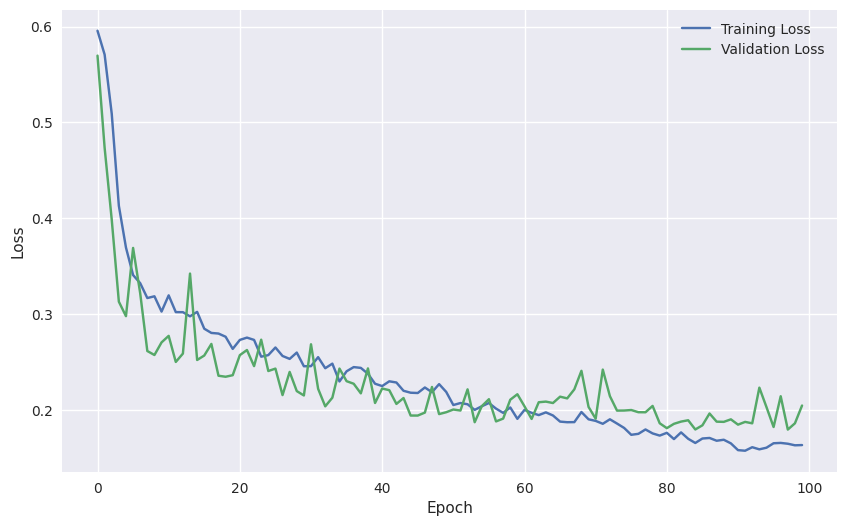

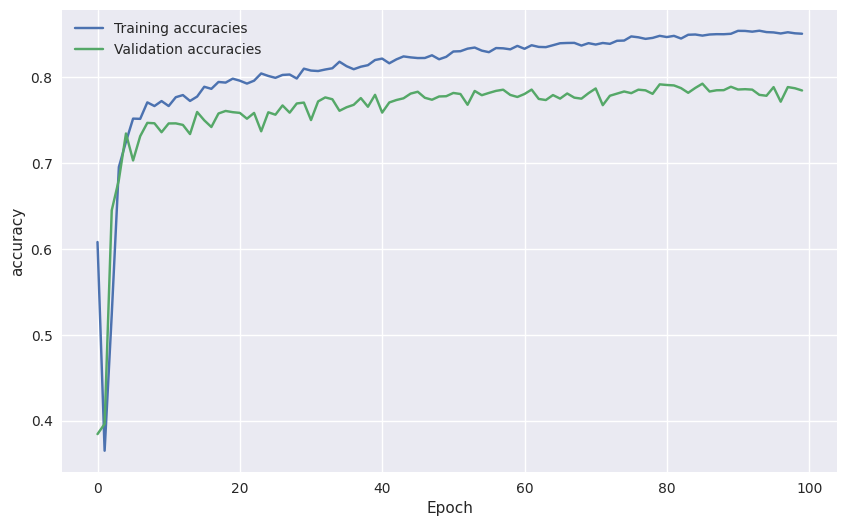

In [86]:
# TODO: Plot training and validation losses and accuracies
with torch.no_grad():
    plt.figure(figsize=(10, 6))
    train_losses_ = [train_losses[i].cpu().numpy() for i in range(len(train_losses))]
    val_losses_ = [val_losses[i].cpu().numpy() for i in range(len(val_losses))]
    plt.plot(train_losses_, label='Training Loss')
    plt.plot(val_losses_, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.plot(train_accs, label='Training accuracies')
    plt.plot(val_accs, label='Validation accuracies')
    plt.xlabel('Epoch')
    plt.ylabel('accuracy')
    plt.legend()
    plt.show()
    

## Plottings

<ipython-input-84-05af04adc617>:101: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  psi = nn.functional.upsample(psi, size=x.size()[2:], mode='bilinear', align_corners=True)


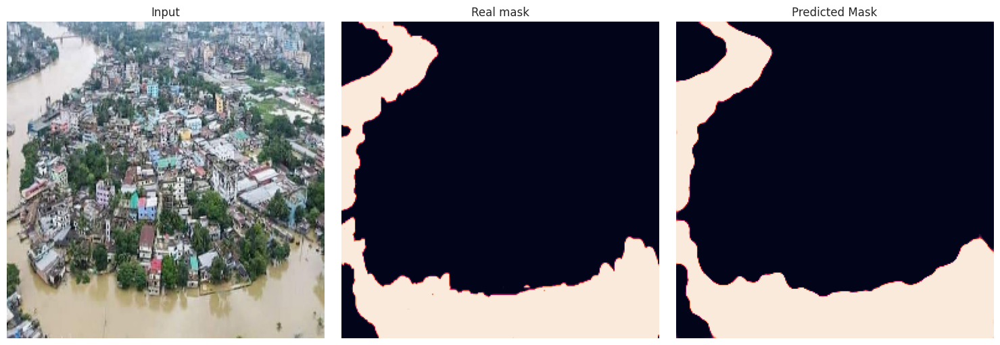

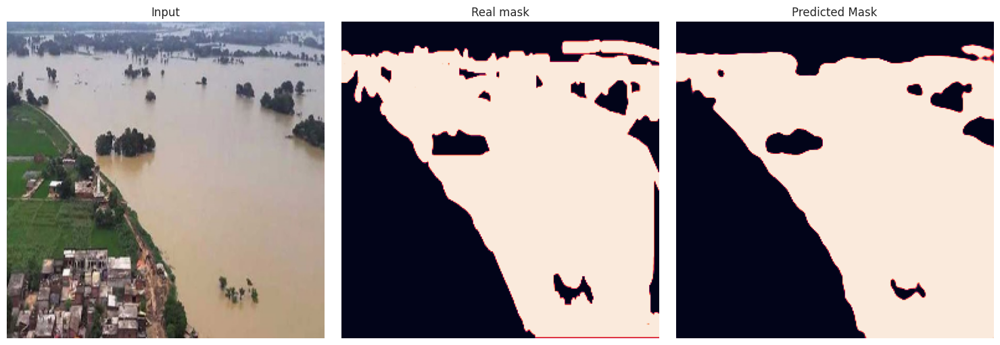

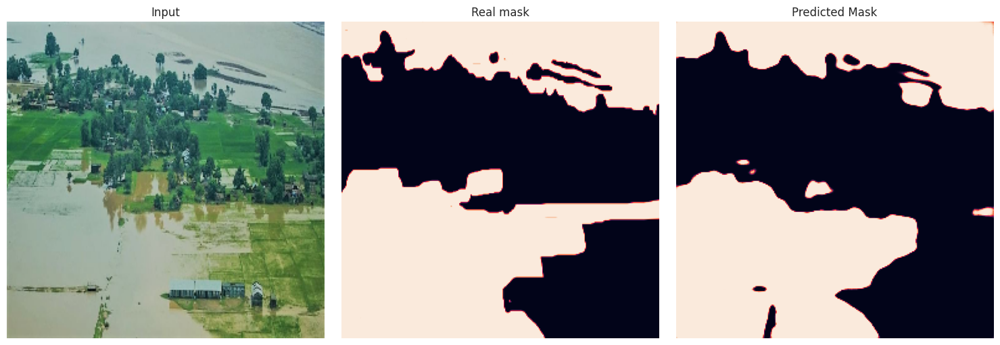

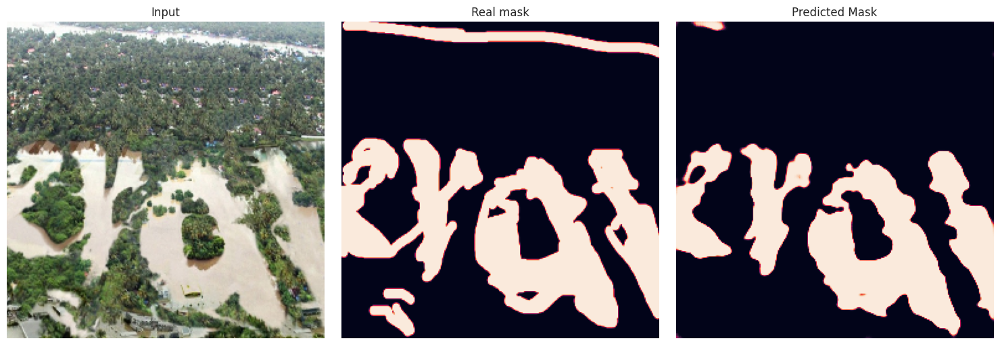

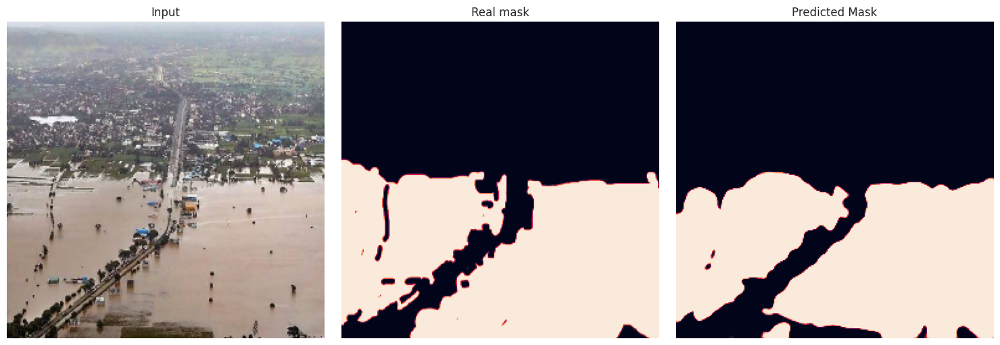

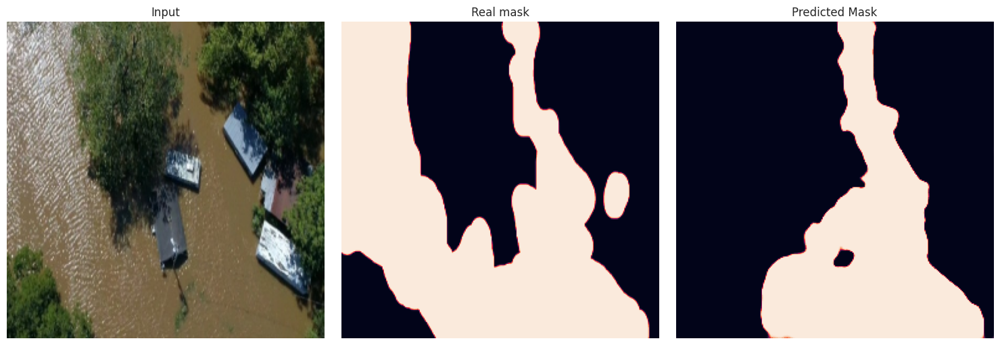

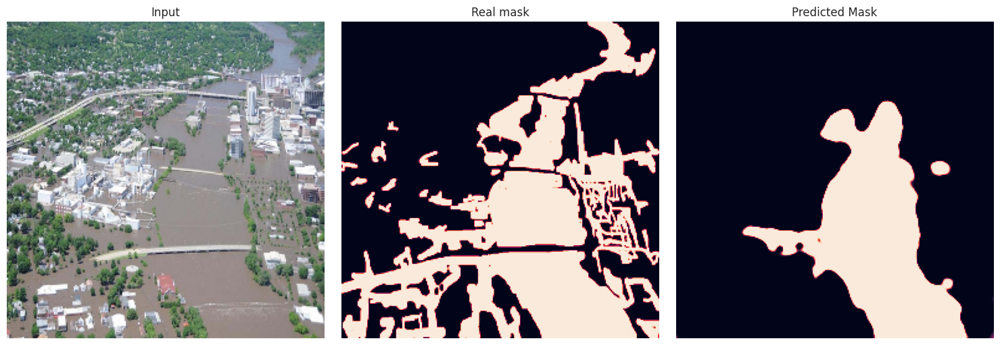

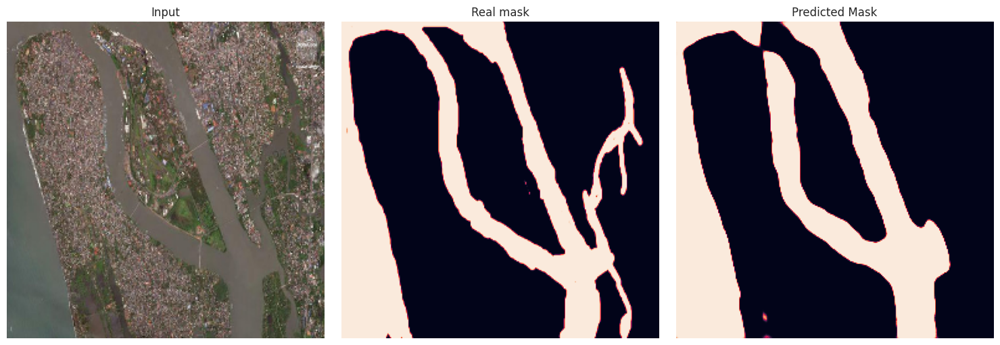

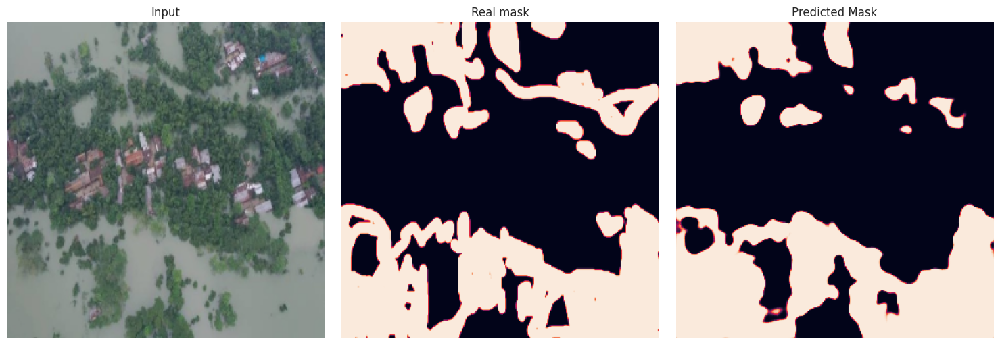

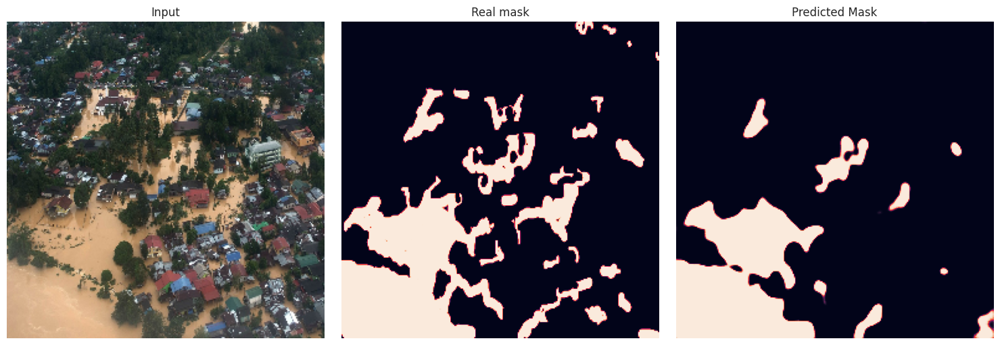

In [91]:
def plot_images(model, dataloader, device, num_images=5):
    model.eval() 
    cnt_image = 0
    
    with torch.no_grad():
        for data in dataloader:
            imgs, msks = data
            imgs = imgs.to(device)
            msks = msks.to(device)

            preds = model(imgs)

            for i in range(len(imgs)):
                if cnt_image >= num_images:
                    return
                
                img = imgs[i].cpu().numpy().transpose(1, 2, 0)
                msk = msks[i].cpu().numpy()
                pred = preds[i].squeeze(0).cpu().numpy()
                
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 3, 1)
                plt.imshow(img)
                plt.title('Input')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(img)
                plt.imshow(msk)
                plt.title('Real mask')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(pred)
                plt.title('Predicted Mask')
                plt.axis('off')

                plt.tight_layout()
                plt.show()

                cnt_image+= 1

plot_images(unet_model, val_loader, device , num_images =10)


1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?
        - They are less sensitive to class imbalance and better capture the spatial relationships between the predicted and true segmentations. 1  However, interpreting loss values requires careful consideration and should be combined with other evaluation metrics and techniques to ensure robust model assessment.

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.
        - High Loss: Indicates poor model performance due to issues like incorrect architecture, insufficient data, hyperparameter problems, or data quality.
        -   Low Loss: Suggests good performance but may signal overfitting (memorizing training data). Always validate on unseen data and visually inspect results.

Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?
- Focus on relevant features: By selectively attending to the most important parts of the input, attention mechanisms help the model focus on the specific objects or regions of interest, reducing distractions from clutter.
- Improve context awareness: Attention allows the model to consider the relationship between different parts of the image, enabling it to better understand the context and make more informed segmentation decisions.
- Enhance boundary localization: Attention mechanisms can help the model to more accurately localize object boundaries, especially in cases where objects are occluded or have complex shapes.

Overall, attention mechanisms refine the segmentation process by:

- Improving feature extraction: By focusing on the most relevant information, attention mechanisms help the model extract more informative features for segmentation.
- Enhancing spatial reasoning: Attention allows the model to better reason about the spatial relationships between different parts of the image, leading to more accurate and precise segmentations.

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?
- Facilitate gradient flow: Skip connections provide direct paths for gradients to flow during backpropagation, enabling more efficient training and preventing the vanishing gradient problem.
- Preserve spatial information: By concatenating feature maps from the encoder to the decoder, skip connections help preserve fine-grained spatial details that are crucial for accurate segmentation.
- Enable multi-scale feature fusion: Skip connections allow the model to combine features from different scales, capturing both local and global context for more robust segmentation.
- Enhance model capacity: Skip connections increase the effective receptive field of the model, enabling it to capture more context and make better segmentation decisions.

Explain the difference between the predicted and processed mask above.